# EXO's Lyrics Analysis

To Understand the data better before createa the Dashbord

### Step 1: Load the Data 
Load the lyrics data that we extract from Genius API 

In [1]:
import pandas as pd

# Load the CSV file into a DataFrame
df = pd.read_csv('/Users/st.amean/Desktop/Portfolio Project/EXO_genius_data.csv')

# Display the first few rows to ensure it's loaded correctly
print(df.head())

   Album        Title                                             Lyrics
0  EXIST   Cinderella  City view that has become more colorful beyond...
1  EXIST   Cream Soda  Each swirl deepens the flavor, babe Feeling pa...
2  EXIST  Hear Me Out   Look babe, I like you even more I spread my w...
3  EXIST    Regret It  I'm on your side I-I'm on your side Let's brin...
4  EXIST  Another Day  Empty your mind of thoughts Leave the past mom...


### Step 2: Perform Lyrics Analysis with some Visualisation
- ##### WORDS FREQUENCISE ANALYSIS 
- ##### SENTIMENT ANALYSIS 
Examining word frequencies or the most common words with NLTK .

In [1]:
!pip install nltk pandas

Use NLTK to tokenize the lyrics

In [3]:
import nltk
from nltk.tokenize import word_tokenize

# Download the NLTK tokenizer models
nltk.download('punkt')

[nltk_data] Downloading package punkt to /Users/st.amean/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
# Define a function to tokenize lyrics
def tokenize_lyrics(lyrics):
    # Tokenizing the text
    tokens = word_tokenize(lyrics)
    # Optionally, convert to lower case
    tokens = [token.lower() for token in tokens if token.isalpha()]  # Remove punctuation and convert to lower case
    return tokens

In [5]:
# Apply the function to the 'Lyrics' column
df['Tokens'] = df['Lyrics'].apply(tokenize_lyrics)

# Display the first few rows to verify the tokenization
print(df[['Title', 'Tokens']].head())

         Title                                             Tokens
0   Cinderella  [city, view, that, has, become, more, colorful...
1   Cream Soda  [each, swirl, deepens, the, flavor, babe, feel...
2  Hear Me Out  [look, babe, i, like, you, even, more, i, spre...
3    Regret It  [i, on, your, side, on, your, side, let, bring...
4  Another Day  [empty, your, mind, of, thoughts, leave, the, ...


In [6]:
# Remove stopwords using NLTK (stopwords ex. i, me, my, the ,...etc.)
from nltk.corpus import stopwords

# Download stopwords from NLTK
nltk.download('stopwords')

# Function to remove stopwords
def remove_stopwords(tokens):
    stop_words = set(stopwords.words('english'))  # Using a set for faster lookup
    filtered_tokens = [token for token in tokens if token not in stop_words]
    return filtered_tokens

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/st.amean/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [7]:
# Apply the function to remove stopwords from tokens
df['Tokens_No_Stopwords'] = df['Tokens'].apply(remove_stopwords)

# Check the DataFrame to see the changes
print(df[['Title', 'Tokens_No_Stopwords']].head())

         Title                                Tokens_No_Stopwords
0   Cinderella  [city, view, become, colorful, beyond, eyes, d...
1   Cream Soda  [swirl, deepens, flavor, babe, feeling, parche...
2  Hear Me Out  [look, babe, like, even, spread, wings, soar, ...
3    Regret It  [side, side, let, bring, baby, warn, warn, war...
4  Another Day  [empty, mind, thoughts, leave, past, moments, ...


### WORDS FREQUENCISE

In [8]:
from collections import Counter

# Aggregate all tokens into a single list
all_tokens = []
for tokens in df['Tokens_No_Stopwords']:
    all_tokens.extend(tokens)

# Count the frequencies of each word
word_freq = Counter(all_tokens)

# Display the 10 most common words
most_common_words = word_freq.most_common(10)
print("Most common words:", most_common_words)


Most common words: [('like', 137), ('yeah', 117), ('la', 111), ('let', 70), ('even', 70), ('day', 70), ('oh', 67), ('go', 63), ('heart', 59), ('want', 56)]


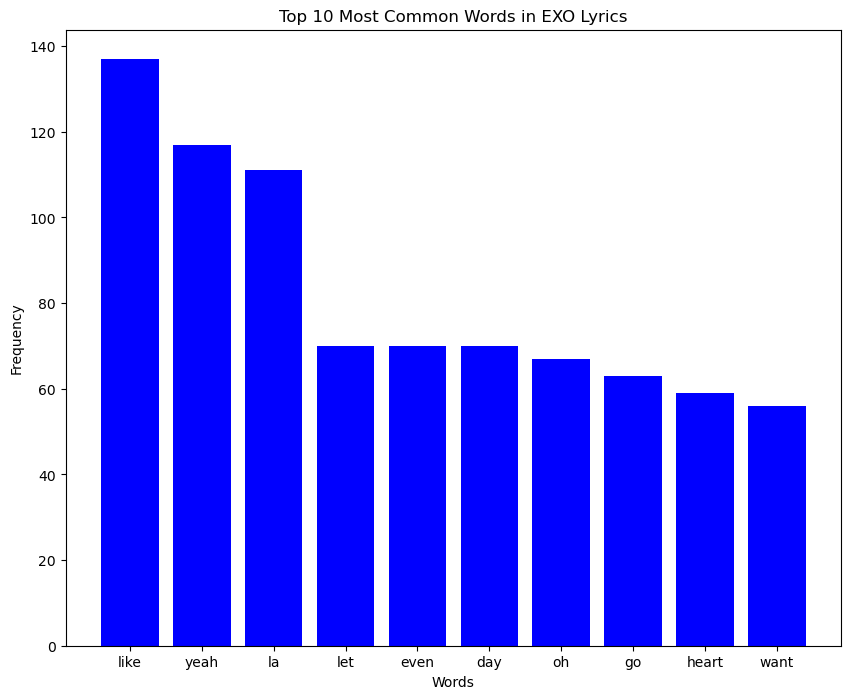

In [9]:
# Visualize the Word Frequencies

import matplotlib.pyplot as plt

# Get the words and their frequencies for plotting
words, freqs = zip(*most_common_words)

# Create a bar chart
plt.figure(figsize=(10, 8))
plt.bar(words, freqs, color='blue')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Top 10 Most Common Words in EXO Lyrics')
plt.show()


In [10]:
# Define a Function to Compute Word Frequencies
def get_most_common_words(tokens, num_top_words=10):
    # Count the frequencies of each word
    word_freq = Counter(tokens)
    # Return the most common words
    return word_freq.most_common(num_top_words)

#### Most Common Words for Each Album

In [11]:
# Group by 'Album' and aggregate tokens
album_words = df.groupby('Album')['Tokens_No_Stopwords'].agg(sum)

# Compute the most common words for each album
album_common_words = album_words.apply(get_most_common_words)
print(album_common_words)


Album
EXIST        [(day, 51), (yeah, 49), (let, 32), (like, 31),...
LOVE SHOT    [(la, 109), (like, 47), (yeah, 45), (even, 33)...
The War      [(like, 59), (crazy, 26), (baby, 26), (nana, 2...
Name: Tokens_No_Stopwords, dtype: object


/tmp/ipykernel_15353/1879907610.py:2: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  album_words = df.groupby('Album')['Tokens_No_Stopwords'].agg(sum)


#### Most Common Words for Each Song

In [12]:
# Group by both 'Album' and 'Title' and aggregate tokens
song_words = df.groupby(['Album', 'Title'])['Tokens_No_Stopwords'].agg(sum)

# Compute the most common words for each song
song_common_words = song_words.apply(lambda tokens: get_most_common_words(tokens, num_top_words=5))
print(song_common_words)


Album      Title                      
EXIST      Another Day                    [(day, 43), (another, 15), (oh, 5), (yesterday...
           Cinderella                     [(cinderella, 16), (like, 6), (want, 3), (stay...
           Cream Soda                     [(cream, 11), (soda, 9), (get, 7), (baby, 6), ...
           Hear Me Out                    [(hear, 20), (come, 6), (need, 5), (hold, 5), ...
           Let Me In                      [(let, 8), (want, 6), (wait, 4), (even, 4), (w...
           Love Fool                      [(watchu, 12), (gim, 12), (like, 10), (want, 1...
           No Makeup                      [(yeah, 11), (little, 11), (even, 9), (makeup,...
           Private Party                  [(party, 31), (yeah, 19), (shawty, 15), (priva...
           Regret It                      [(warn, 31), (woo, 13), (everything, 10), (mak...
LOVE SHOT  24 7                           [(ooh, 12), (think, 10), (long, 5), (even, 5),...
           Damage                        

/tmp/ipykernel_15353/1672670130.py:2: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  song_words = df.groupby(['Album', 'Title'])['Tokens_No_Stopwords'].agg(sum)


#### Word Clouds 

In [2]:
#Install the Required Package
!pip install wordcloud matplotlib

In [14]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def create_word_cloud(text, title="Word Cloud"):
    # Generate a word cloud image
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Display the word cloud image
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis("off")  # Turn off axis labels
    plt.show()

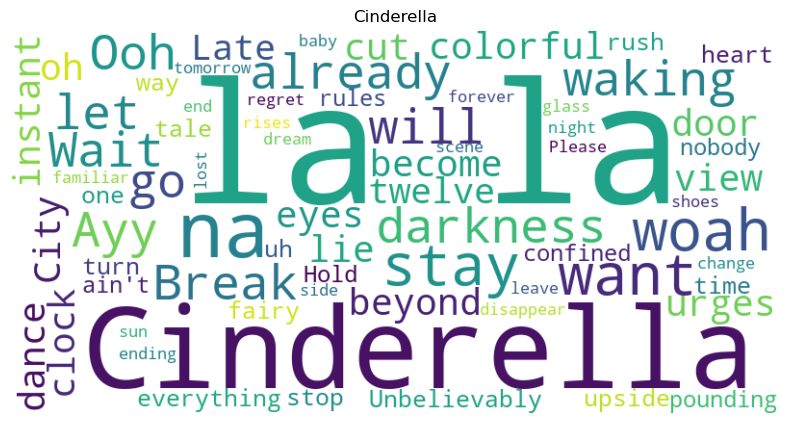

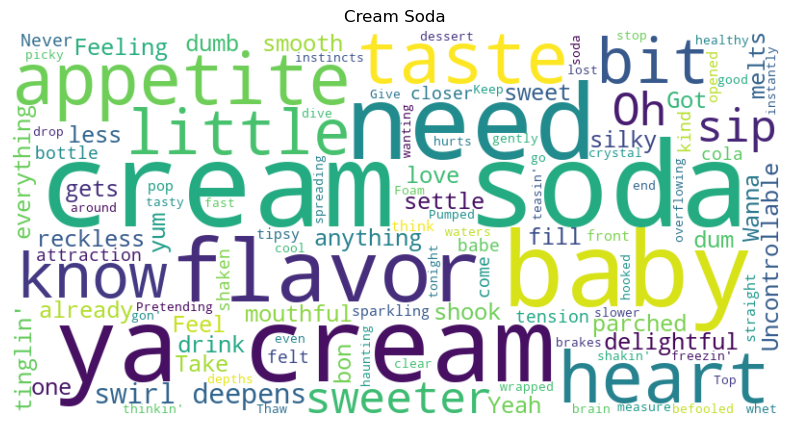

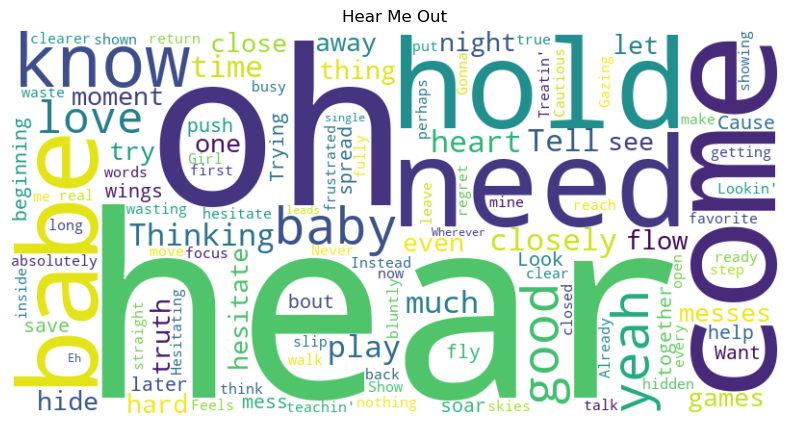

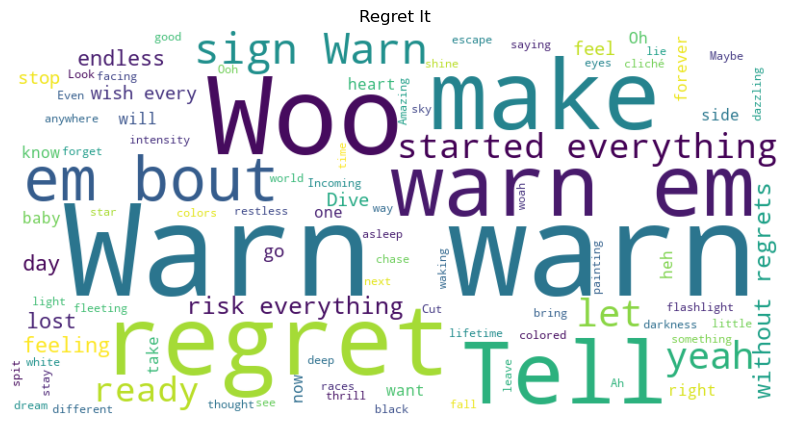

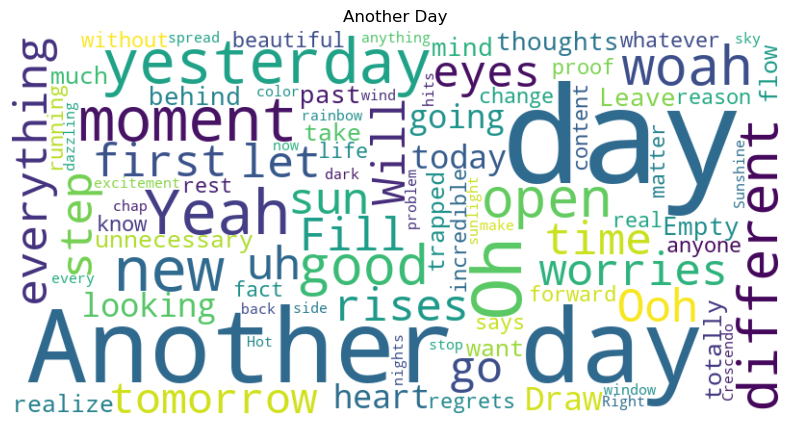

...

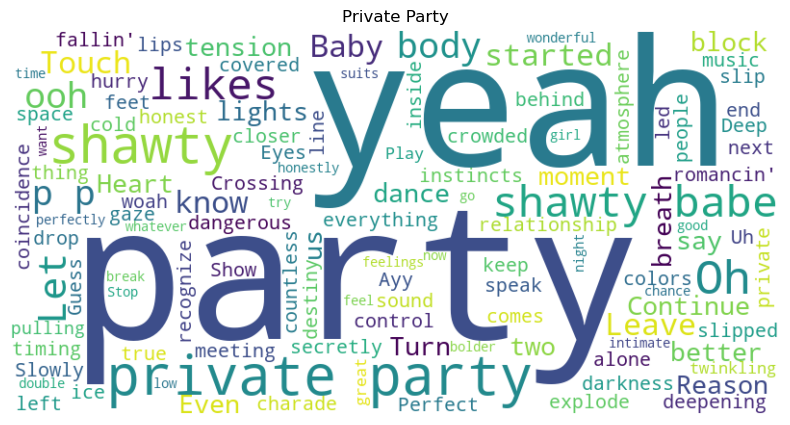

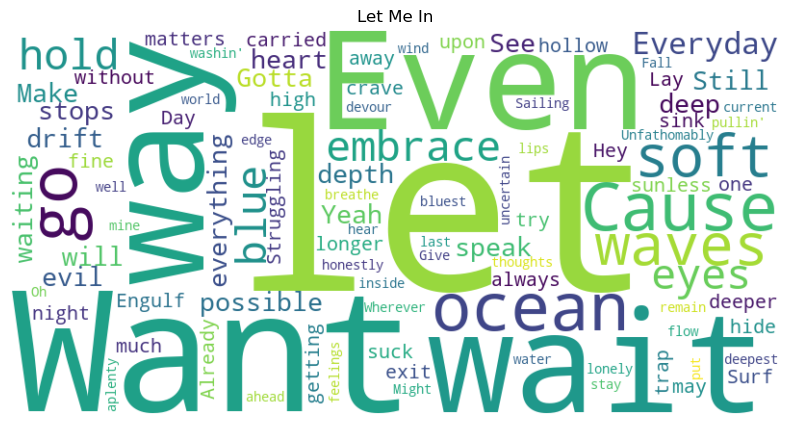

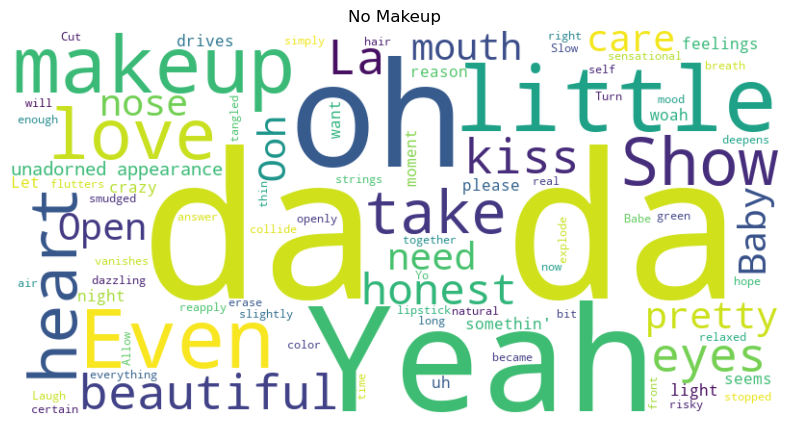

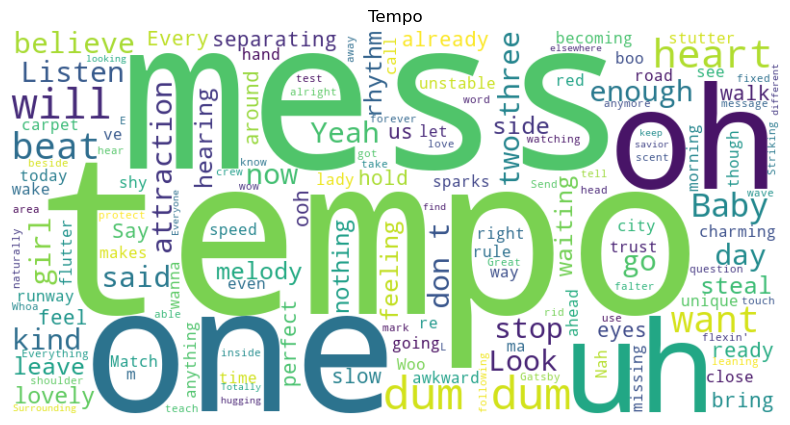

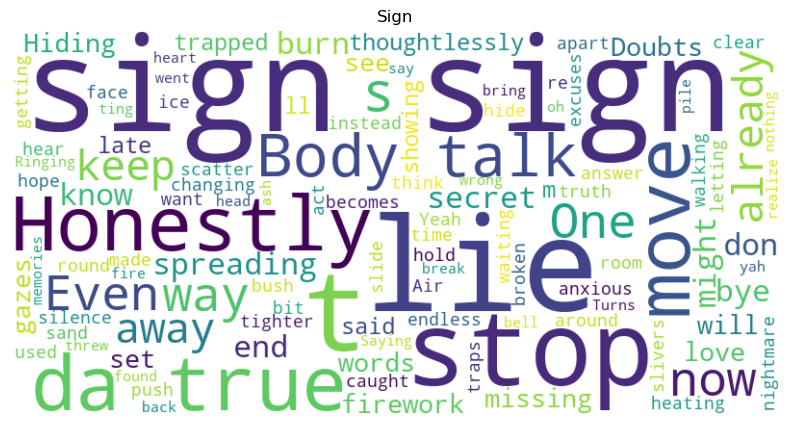

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 53944 (\N{HANGUL SYLLABLE TEU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 46972 (\N{HANGUL SYLLABLE RA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50864 (\N{HANGUL SYLLABLE U}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 47560 (\N{HANGUL SYLLABLE MA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


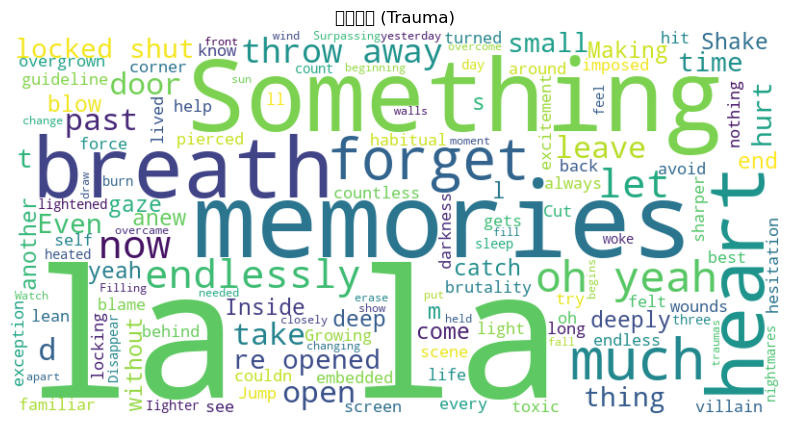

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44032 (\N{HANGUL SYLLABLE GA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45140 (\N{HANGUL SYLLABLE GGEUM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


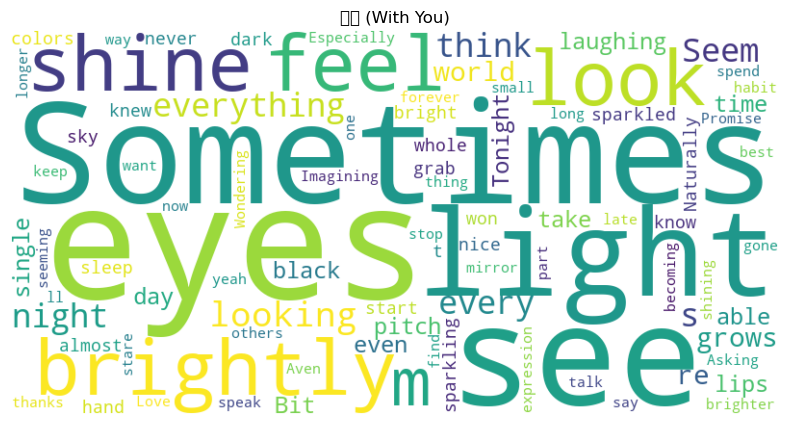

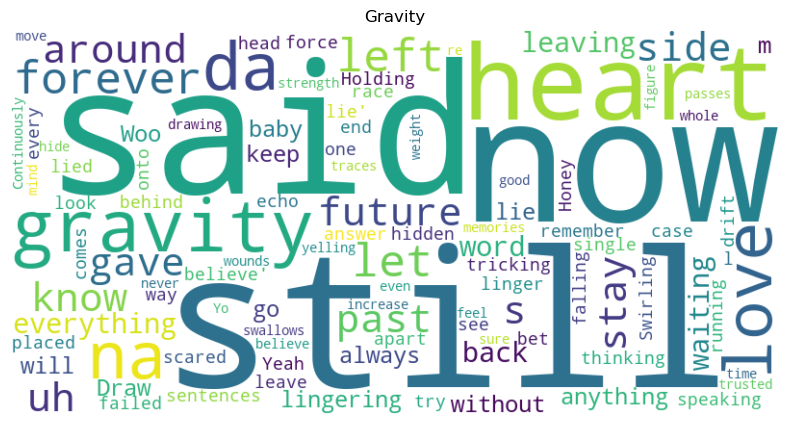

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45823 (\N{HANGUL SYLLABLE DAH}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51008 (\N{HANGUL SYLLABLE EUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49692 (\N{HANGUL SYLLABLE SUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


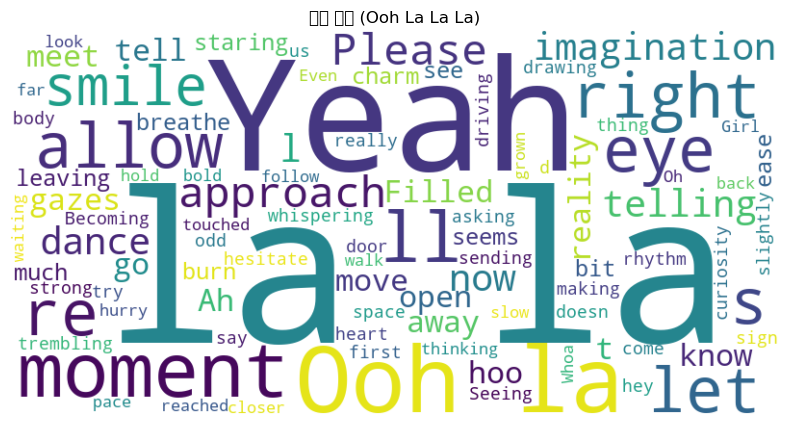

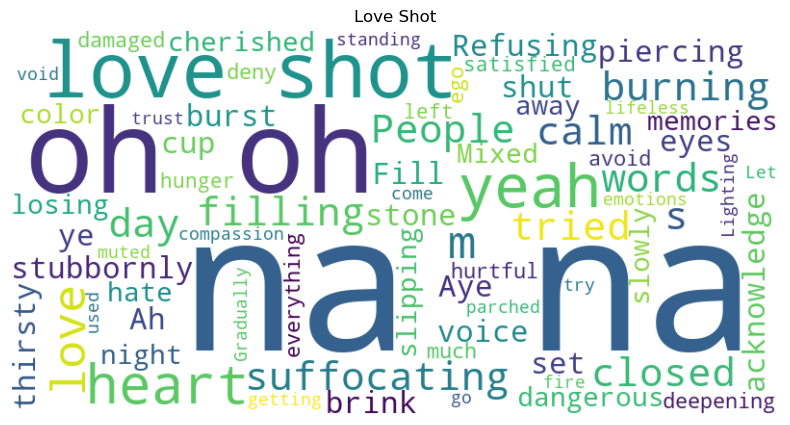

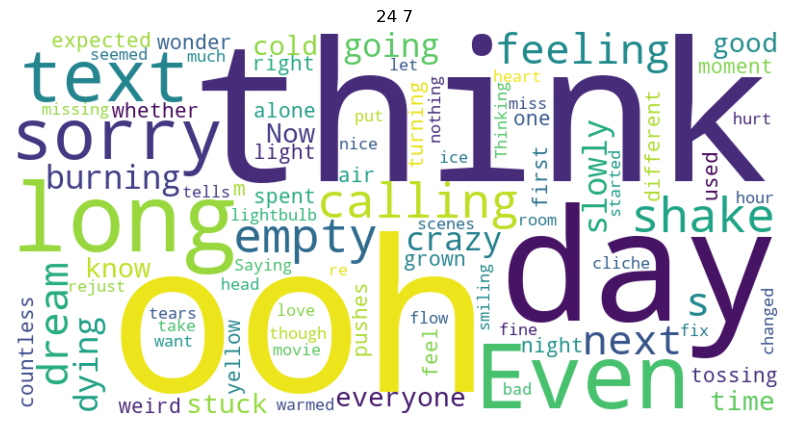

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50668 (\N{HANGUL SYLLABLE YEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44592 (\N{HANGUL SYLLABLE GI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51080 (\N{HANGUL SYLLABLE ISS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51012 (\N{HANGUL SYLLABLE EUL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44172 (\N{HANGUL SYLLABLE GE}) missing from current font.
  fig.canvas.print_

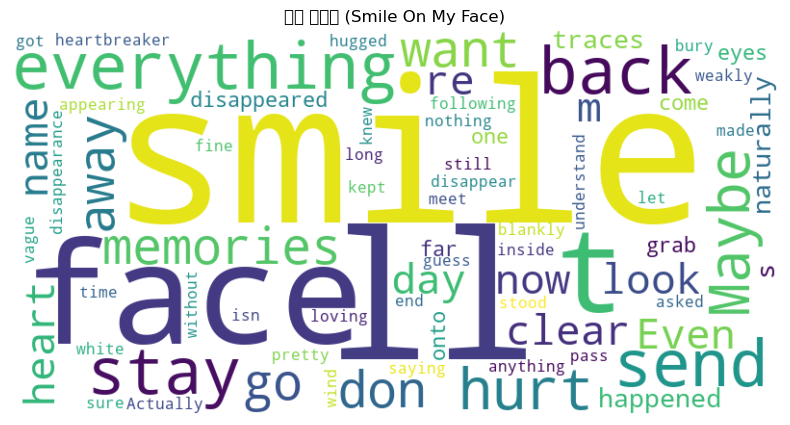

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50724 (\N{HANGUL SYLLABLE O}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50500 (\N{HANGUL SYLLABLE A}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


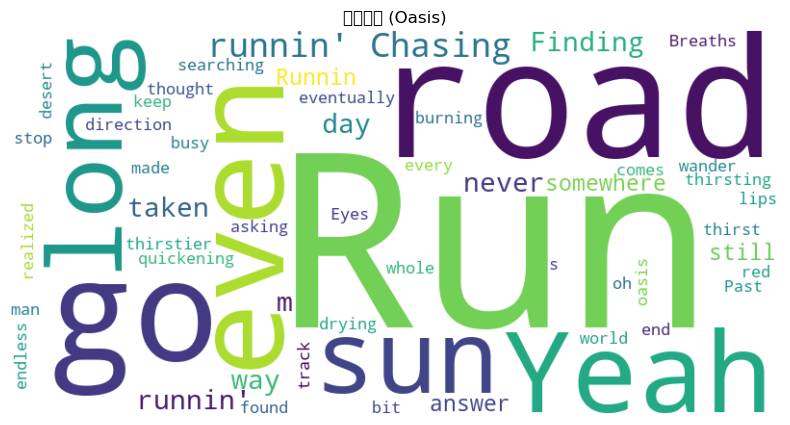

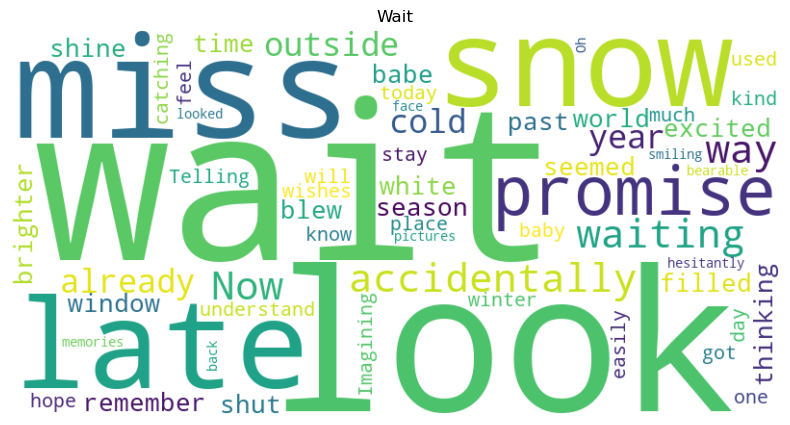

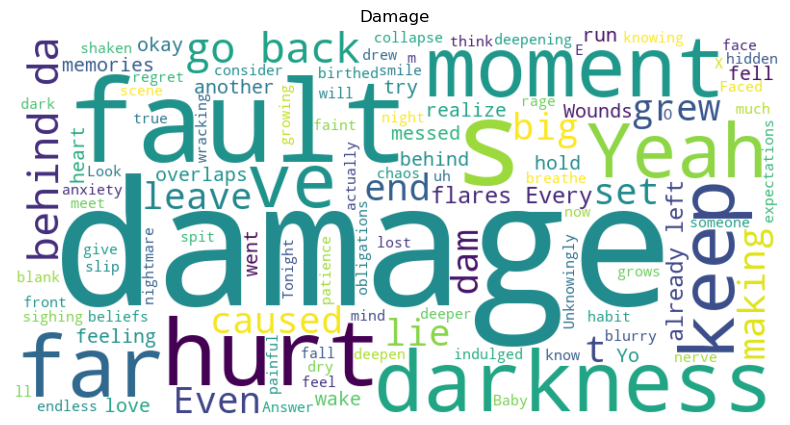

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 54980 (\N{HANGUL SYLLABLE HU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 54253 (\N{HANGUL SYLLABLE POG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 54413 (\N{HANGUL SYLLABLE PUNG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


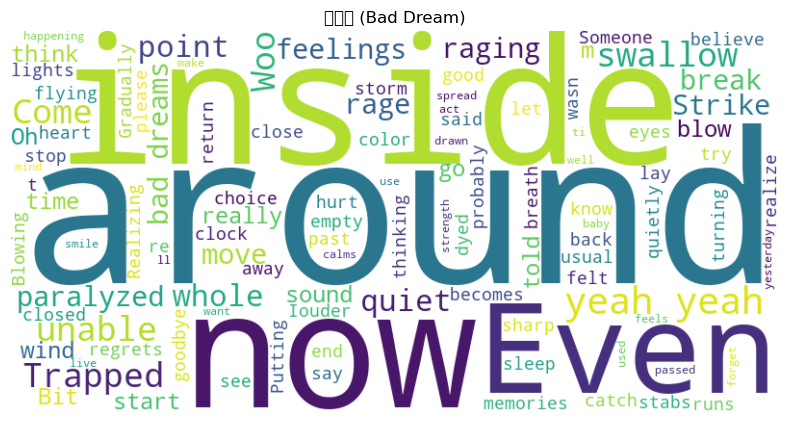

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45236 (\N{HANGUL SYLLABLE NAE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 48120 (\N{HANGUL SYLLABLE MI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 52432 (\N{HANGUL SYLLABLE CYEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


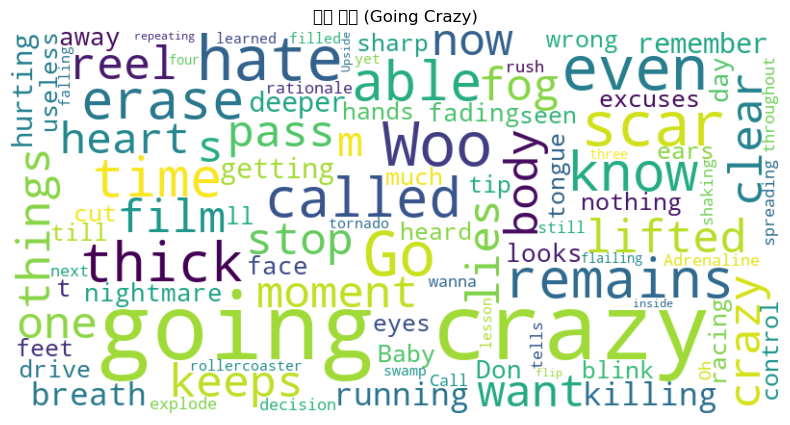

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49548 (\N{HANGUL SYLLABLE SO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 47492 (\N{HANGUL SYLLABLE REUM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


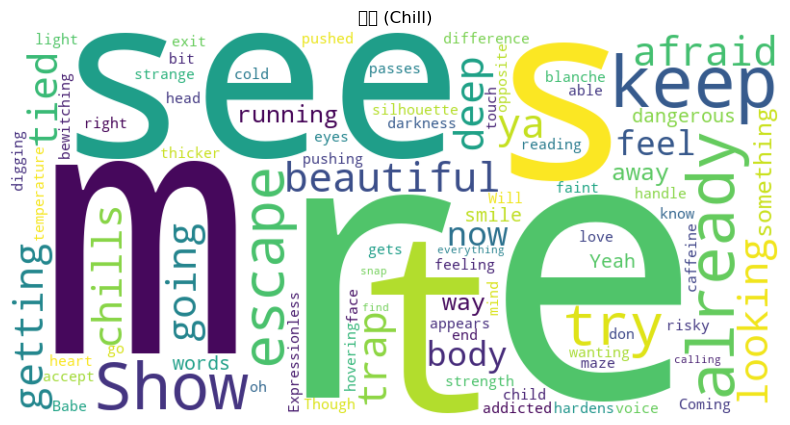

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45320 (\N{HANGUL SYLLABLE NEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51032 (\N{HANGUL SYLLABLE YI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49552 (\N{HANGUL SYLLABLE SON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51667 (\N{HANGUL SYLLABLE JIS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


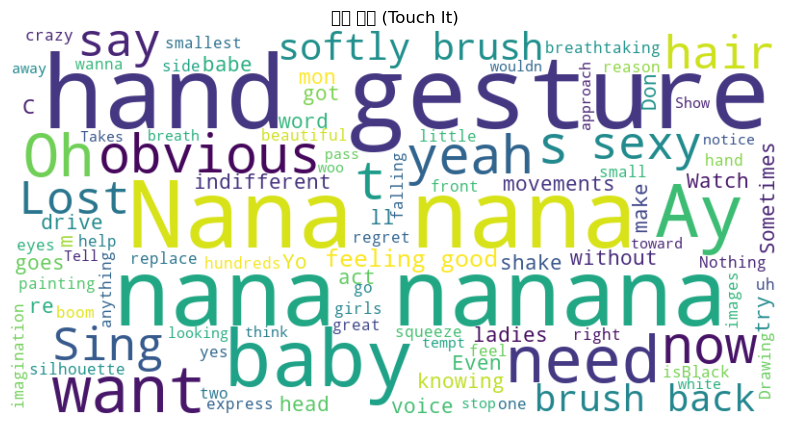

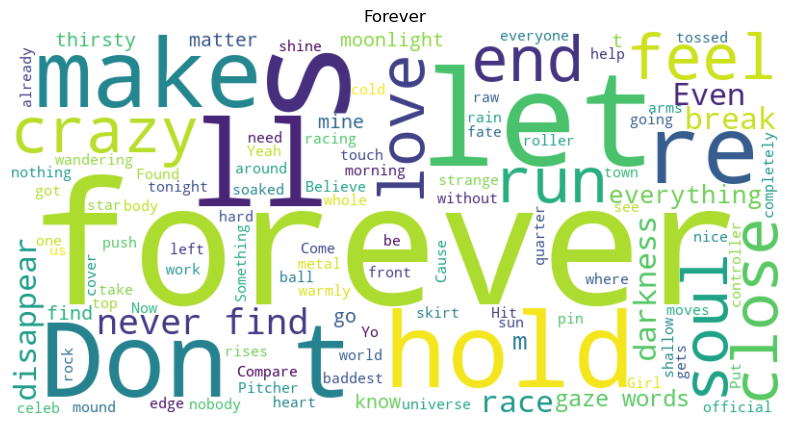

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50613 (\N{HANGUL SYLLABLE EOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 44151 (\N{HANGUL SYLLABLE GEOD}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45716 (\N{HANGUL SYLLABLE NEUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 48164 (\N{HANGUL SYLLABLE BAM}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


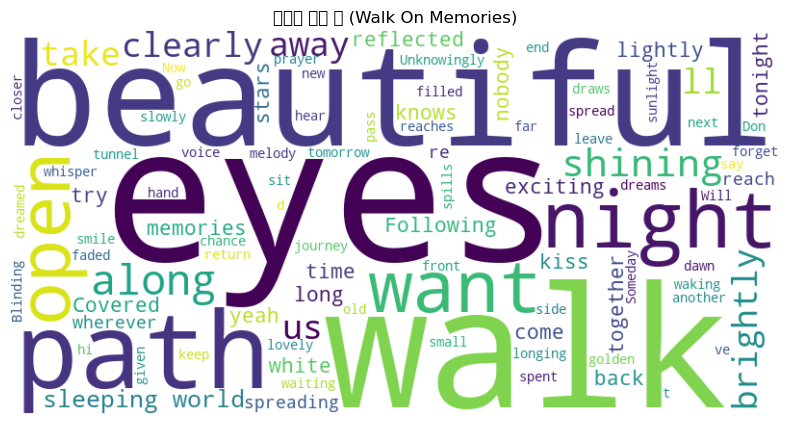

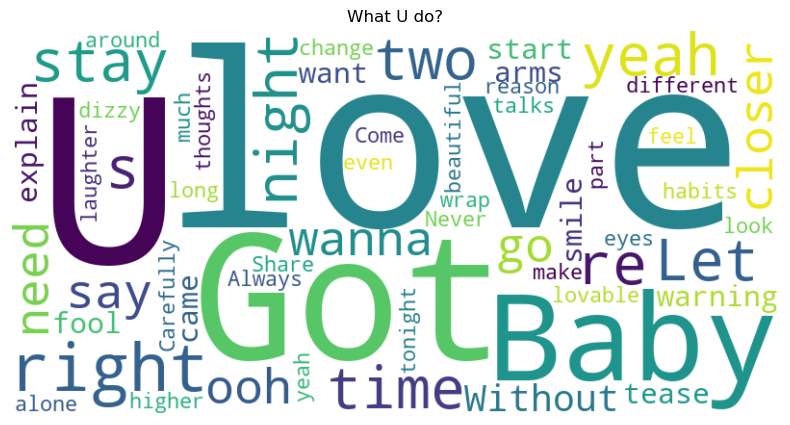

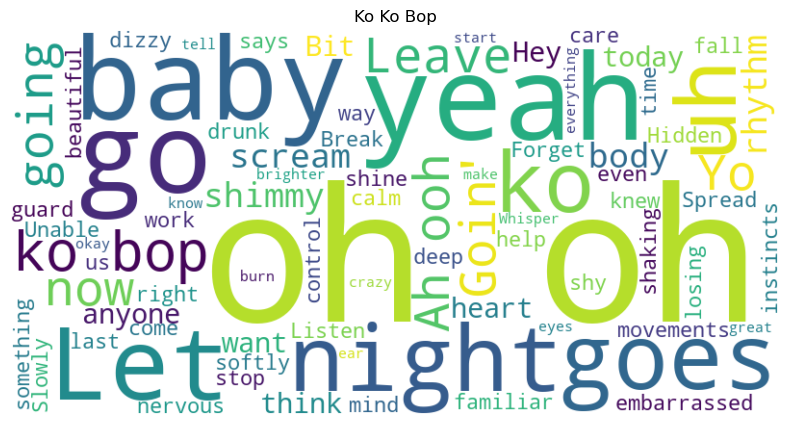

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 45796 (\N{HANGUL SYLLABLE DA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 47788 (\N{HANGUL SYLLABLE MON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 46300 (\N{HANGUL SYLLABLE DEU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


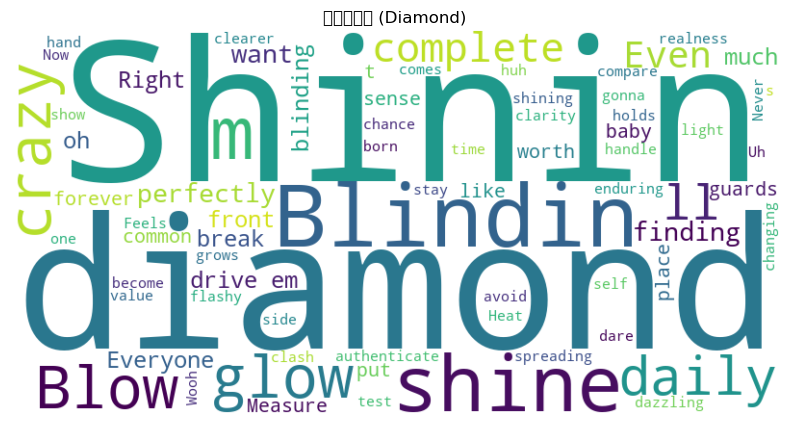

/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50556 (\N{HANGUL SYLLABLE YA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 21069 (\N{CJK UNIFIED IDEOGRAPH-524D}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/Applications/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 22812 (\N{CJK UNIFIED IDEOGRAPH-591C}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


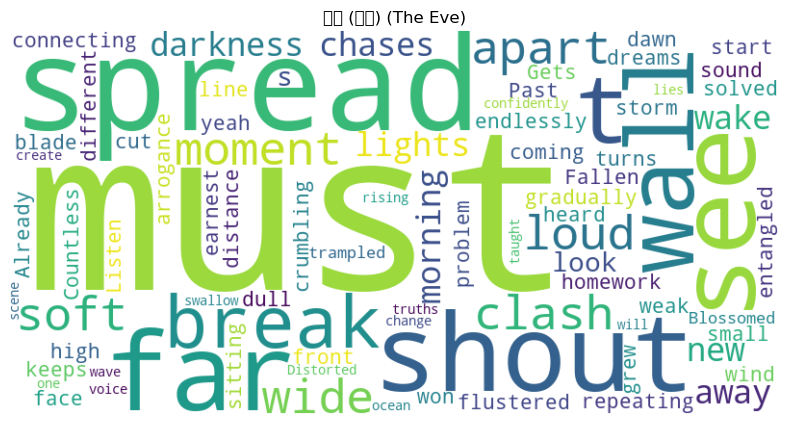

In [15]:
# Applying the function to each song's lyrics
for index, row in df.iterrows():
    create_word_cloud(row['Lyrics'], title=row['Title'])

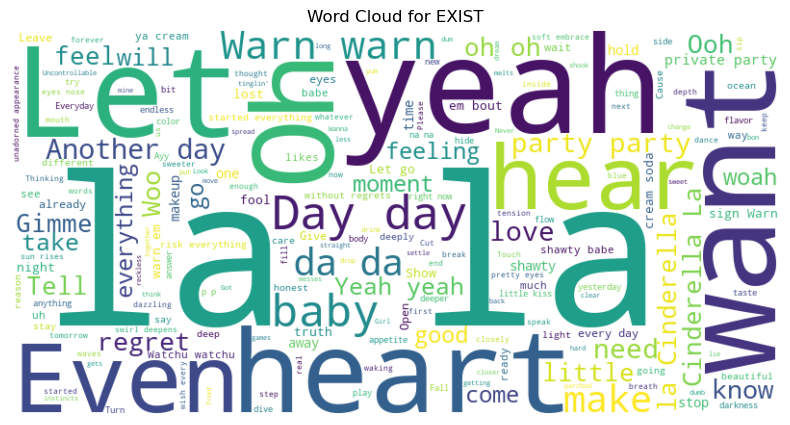

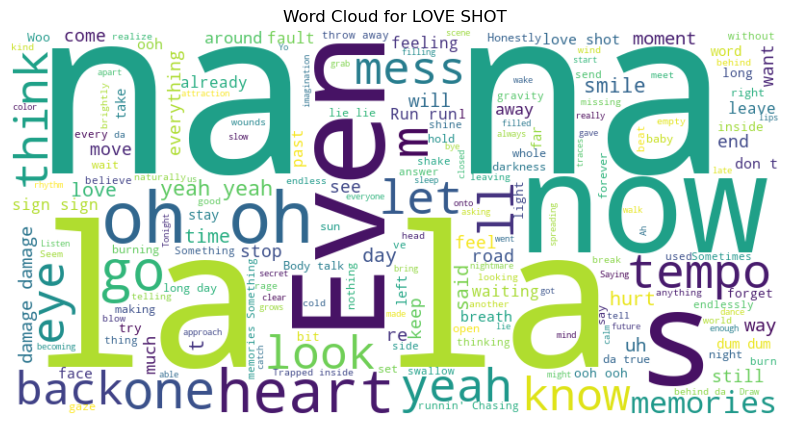

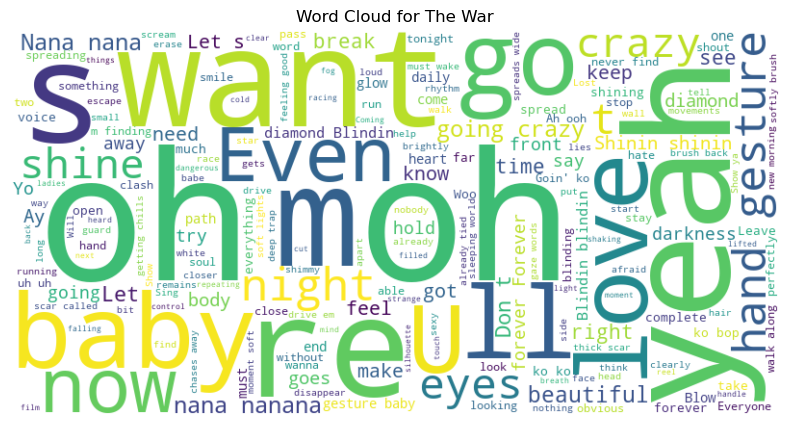

In [16]:
# Group by 'Album' and join lyrics
album_lyrics = df.groupby('Album')['Lyrics'].agg(lambda texts: ' '.join(texts))

# Create a word cloud for each album
for album, lyrics in album_lyrics.items():
    create_word_cloud(lyrics, title=f"Word Cloud for {album}")


### SENTIMENT ANALYSIS

#### VADER
VADER (Valence Aware Dictionary and sEntiment Reasoner) is particularly good at handling sentiments expressed in social media (like tweets, comments) through both the polarity and intensity of emotions. However, it does not directly classify into emotion categories like "Happy" or "Sad" but gives a compound score indicating overall sentiment. So we classify in to "Happy","Sad","Neutral" form the score.

In [3]:
#Installing NLTK and VADER
!pip install nltk

In [18]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/st.amean/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [19]:
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

def get_vader_sentiment(text):
    # Get sentiment scores
    scores = sia.polarity_scores(text)
    compound = scores['compound']
    # Define thresholds for compound score
    if compound >= 0.05:
        return 'Happy'
    elif compound <= -0.05:
        return 'Sad'
    else:
        return 'Neutral'


In [20]:
# Apply VADER sentiment to lyrics
df['Mood'] = df['Lyrics'].apply(get_vader_sentiment)

# Display the results
print(df[['Title', 'Mood']].head())

         Title   Mood
0   Cinderella  Happy
1   Cream Soda  Happy
2  Hear Me Out  Happy
3    Regret It  Happy
4  Another Day  Happy


#### NRC Emotion Lexicon
The NRC Emotion Lexicon is a useful resource for text analysis that associates words with emotions and sentiments.Using the NRC Emotion Lexicon in Python can help you classify text by emotions like "Happy," "Sad," "Neutral," and "Hate," or similar categories.

In [4]:
#Installing nrclex
!pip install NRCLex

#### Pominant Emotion & Emotion Distribution

In [22]:
from nrclex import NRCLex

# Define mood mapping globally so it can be reused without redefining it
mood_mapping = {
    'joy': 'Happy',
    'sadness': 'Sad',
    'anger': 'Angry',
    'disgust': 'Hate',
    'fear': 'Fearful',
    'trust': 'Happy',
    'anticipation': 'Neutral',
    'surprise': 'Neutral',
    'positive': 'Positive',
    'negative': 'Negative',
}

# Function to extract emotion counts
def get_predominant_emotion(text):
    # Create an NRCLex object
    emotion = NRCLex(text)
    # Map the raw emotions to broader categories
    mapped_emotions = {}
    for key, value in emotion.raw_emotion_scores.items():
        broader_category = mood_mapping.get(key, key)  # Use mapping or keep original if not specified
        if broader_category in mapped_emotions:
            mapped_emotions[broader_category] += value
        else:
            mapped_emotions[broader_category] = value

    # Find the emotion with the maximum count
    max_emotion = max(mapped_emotions, key=mapped_emotions.get)

    return mapped_emotions, max_emotion


In [23]:
# Apply the function to the 'Lyrics' column and extract results
df['Emotion_Details'] = df['Lyrics'].apply(get_predominant_emotion)
df['Emotion_Counts'] = df['Emotion_Details'].apply(lambda x: x[0])
df['Emotion_Dominant'] = df['Emotion_Details'].apply(lambda x: x[1])

# Clean up by dropping the temporary Emotion_Details column if no longer needed
df.drop('Emotion_Details', axis=1, inplace=True)

#### Emotion Distribution in Albums

In [24]:
# Function to sum dictionaries
def sum_dicts(dicts):
    summed_dict = {}
    for d in dicts:
        for key, value in d.items():
            if key in summed_dict:
                summed_dict[key] += value
            else:
                summed_dict[key] = value
    return summed_dict

# Group by 'Album' and aggregate using the custom sum_dicts function
album_emotions = df.groupby('Album')['Emotion_Counts'].agg(sum_dicts)


Album
EXIST        {'Angry': 37, 'Hate': 32, 'Negative': 121, 'Sa...
LOVE SHOT    {'Angry': 119, 'Neutral': 156, 'Hate': 79, 'Fe...
The War      {'Angry': 65, 'Fearful': 86, 'Negative': 112, ...
Name: Emotion_Counts, dtype: object


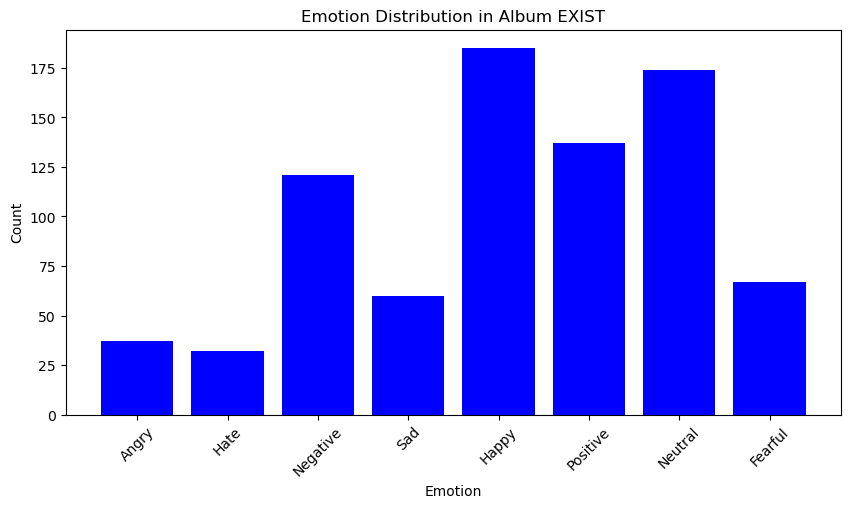

In [25]:
# Print the emotion distribution for each album
print(album_emotions)

# Bar chart visualisation
import matplotlib.pyplot as plt

# Example visualization for one album, e.g., 'EXIST'
if 'EXIST' in album_emotions.index:
    emotions = album_emotions.loc['EXIST']
    plt.figure(figsize=(10, 5))
    plt.bar(emotions.keys(), emotions.values(), color='blue')
    plt.title('Emotion Distribution in Album EXIST')
    plt.xlabel('Emotion')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()
else:
    print("Album EXIST not found in the data.")


In [26]:
# Function for Donut Pie Chart Visualisation
import matplotlib.pyplot as plt
import numpy as np

def plot_donut_chart(emotions, album_name):
    # Data preparation
    labels = list(emotions.keys())
    sizes = list(emotions.values())
    total = sum(sizes)
    
    # Calculate percentage of each emotion
    percentages = [100 * s / total for s in sizes]
    
    # Sort the labels and sizes based on sizes for color consistency
    sorted_labels_sizes = sorted(zip(labels, percentages), key=lambda x: x[1], reverse=True)
    labels, sorted_sizes = zip(*sorted_labels_sizes)

    # Create a pie chart
    fig, ax = plt.subplots()
    cmap = plt.get_cmap('PuBu')  
    
    # Generate color intensities based on the size
    colors = [cmap(i / max(sorted_sizes)) for i in sorted_sizes]
    
    wedges, texts, autotexts = ax.pie(sorted_sizes, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, colors=colors)
    
    # Draw a circle at the center to achieve the donut look
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig.gca().add_artist(centre_circle)
    
    # Aspect ratio to ensure the pie is drawn as a circle
    ax.axis('equal')  
    
    # Title and legend
    plt.title(f'Emotion Distribution in Album: {album_name}')
    plt.legend(wedges, labels,
               title="Emotions",
               loc="center left",
               bbox_to_anchor=(1, 0, 0.5, 1))
    
    plt.show()


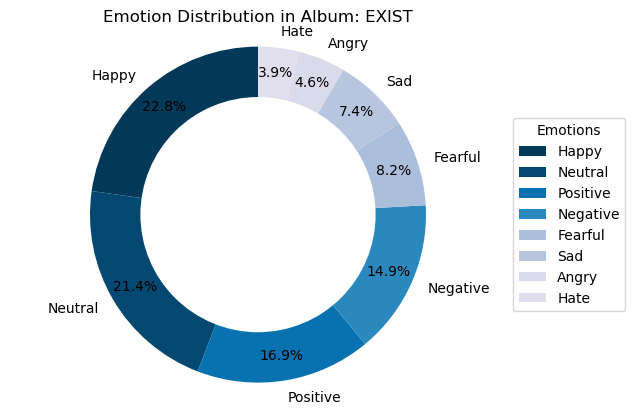

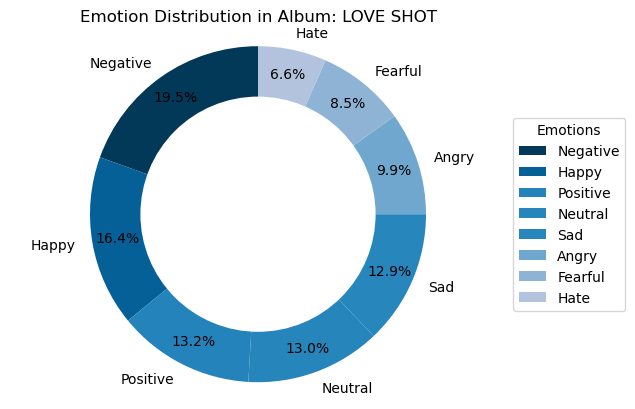

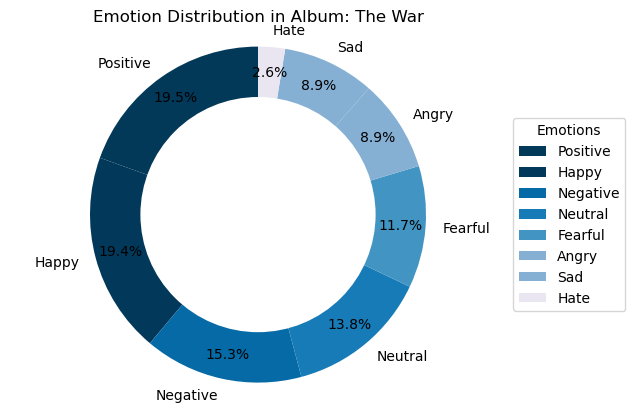

In [27]:
for album, emotions in album_emotions.items():
    plot_donut_chart(emotions, album)

In [28]:
# RECHECK DATA FRAME
df

,Album,Title,Lyrics,Tokens,Tokens_No_Stopwords,Mood,Emotion_Counts,Emotion_Dominant
0,EXIST,Cinderella,City view that has become more colorful beyond...,"[city, view, that, has, become, more, colorful...","[city, view, become, colorful, beyond, eyes, d...",Happy,"{'Angry': 4, 'Hate': 2, 'Negative': 8, 'Sad': ...",Negative
1,EXIST,Cream Soda,"Each swirl deepens the flavor, babe Feeling pa...","[each, swirl, deepens, the, flavor, babe, feel...","[swirl, deepens, flavor, babe, feeling, parche...",Happy,"{'Angry': 3, 'Fearful': 3, 'Negative': 10, 'Ne...",Happy
2,EXIST,Hear Me Out,"Look babe, I like you even more I spread my w...","[look, babe, i, like, you, even, more, i, spre...","[look, babe, like, even, spread, wings, soar, ...",Happy,"{'Happy': 25, 'Positive': 22, 'Hate': 3, 'Nega...",Happy
3,EXIST,Regret It,I'm on your side I-I'm on your side Let's brin...,"[i, on, your, side, on, your, side, let, bring...","[side, side, let, bring, baby, warn, warn, war...",Happy,"{'Happy': 36, 'Positive': 13, 'Neutral': 59, '...",Neutral
4,EXIST,Another Day,Empty your mind of thoughts Leave the past mom...,"[empty, your, mind, of, thoughts, leave, the, ...","[empty, mind, thoughts, leave, past, moments, ...",Happy,"{'Positive': 14, 'Neutral': 16, 'Happy': 17, '...",Happy
5,EXIST,Love Fool,"But it feels like an illusion, approaching you...","[but, it, feels, like, an, illusion, approachi...","[feels, like, illusion, approaching, like, tou...",Happy,"{'Negative': 21, 'Neutral': 6, 'Angry': 4, 'Ha...",Negative
6,EXIST,Private Party,"Yeah, ooh Yeah, yeah, yeah Ayy, yeah At the e...","[yeah, ooh, yeah, yeah, yeah, ayy, yeah, at, t...","[yeah, ooh, yeah, yeah, yeah, ayy, yeah, end, ...",Happy,"{'Angry': 5, 'Fearful': 4, 'Negative': 6, 'Sad...",Happy
7,EXIST,Let Me In,"Wait, don't hide from me again Struggling, but...","[wait, do, hide, from, me, again, struggling, ...","[wait, hide, struggling, even, sink, fine, mak...",Sad,"{'Fearful': 5, 'Negative': 10, 'Sad': 7, 'Neut...",Neutral
8,EXIST,No Makeup,"Yeah, yeah Oh-oh No, oh Oh-oh Your slightly s...","[yeah, yeah, no, oh, your, slightly, smudged, ...","[yeah, yeah, oh, slightly, smudged, lipstick, ...",Happy,"{'Fearful': 9, 'Negative': 6, 'Angry': 7, 'Sad...",Happy
9,LOVE SHOT,Tempo,I’ve been waiting for this feeling (Oh-oh-oh) ...,"[i, ve, been, waiting, for, this, feeling, i, ...","[waiting, feeling, wan, na, one, hearing, melo...",Happy,"{'Angry': 4, 'Neutral': 18, 'Hate': 19, 'Fearf...",Happy


In [29]:
df.to_csv("df.csv", index=False)

### Prepare Data for Visualisation Dasboard 

In [30]:
# Sentiment DATA 
# Check the type of the first entry in the Emotion_Counts column
type(df.loc[0, 'Emotion_Counts'])


dict

In [31]:
# Exploding the 'Emotion_Counts' dictionary into a long format DataFrame
emotion_df = df['Emotion_Counts'].apply(pd.Series).stack().reset_index(level=-1)
emotion_df.columns = ['Emotion', 'E_count']
emotion_df['Emotion'] = emotion_df.index
emotion_df.reset_index(drop=True, inplace=True)

In [32]:
try:
    # Ensuring all entries are strings before applying eval
    emotion_df = pd.DataFrame(
        [(index, emotion, count) for index, emotions in df['Emotion_Counts'].astype(str).apply(eval).items() 
         for emotion, count in emotions.items()],
        columns=['index', 'Emotion', 'E_count']
    )
    emotion_df.set_index('index', inplace=True)

    # Merging the exploded emotions back with the original DataFrame (excluding the original 'Emotion_Counts' column)
    df1 = df.drop(columns=['Emotion_Counts', 'Tokens', 'Tokens_No_Stopwords']).join(emotion_df)

    # Check the output
    output_check = df1.head()
except Exception as e:
    output_check = str(e)

# Preview df1
output_check


,Album,Title,Lyrics,Mood,Emotion_Dominant,Emotion,E_count
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,Angry,4
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,Hate,2
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,Negative,8
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,Sad,7
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,Happy,6


In [33]:
# Lyrics in WORDS DATA 
# For df2, we need to flatten the Tokens_No_Stopwords into a single column
# Check the type of the first entry in the Tokens_No_Stopwords column to determine if conversion is necessary
type(df.loc[0, 'Tokens_No_Stopwords'])


list

In [34]:
# No need to convert, directly explode the Tokens_No_Stopwords into separate rows for df2
df2 = df[['Album', 'Title', 'Lyrics', 'Mood', 'Emotion_Dominant', 'Tokens_No_Stopwords']].explode('Tokens_No_Stopwords')
df2 = df2.rename(columns={'Tokens_No_Stopwords': 'Word'})  # Rename column for Tableau use

# Preview df2
df2.head()


,Album,Title,Lyrics,Mood,Emotion_Dominant,Word
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,city
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,view
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,become
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,colorful
0,EXIST,Cinderella,City view that has become more colorful beyond...,Happy,Negative,beyond


In [35]:
# Export DATA FRAME  
df1.to_csv("Lyrics_sentiment_data.csv", index=False)
df2.to_csv("Lyrics_word_data.csv", index=False)